In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle
from torch.utils.data import Subset
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from FID import fidScore

### Hyperparameters

In [2]:
LEARNING_RATE = 0.0002
BATCH_SIZE = 128
IMAGE_SIZE = 64
IMAGE_CHANNELS = 3
Z_DIM = 100
EPOCHS = 40
DISC_FEATURES = 64
GEN_FEATURES = 64
BETA1 = 0.55   # use 0 when running on cpu

### Download Images for Training

In [4]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

trainset = Dataset.CIFAR10('./data', download=True, transform=transform)
test = Dataset.CIFAR10('./data', download=True, train=False, transform=transform)
trainset=trainset+test

trainloader = torch.utils.data.DataLoader(trainset, shuffle=True, batch_size=BATCH_SIZE)

Files already downloaded and verified
Files already downloaded and verified


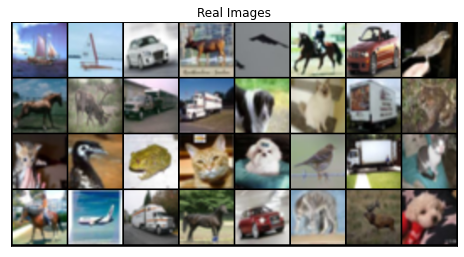

In [5]:
def imshow(imgs, title, figsize=(8,8), nrow=8):
    imgs = vutils.make_grid(imgs, nrow, normalize=True)
    imgs=imgs.numpy()
    imgs=np.transpose(imgs, (1,2,0))
    plt.figure(figsize=figsize)
    plt.imshow(imgs)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.show()
    #plt.imsave('test.png',imgs)
    
images, labels = next(iter(trainloader))
imshow(images[:32], 'Real Images')

### Generator and Discriminator Models

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(Z_DIM, GEN_FEATURES*16, 4, 1, 0, bias=False), # 1024 x 4 x 4
            self._block(GEN_FEATURES*16, GEN_FEATURES*8, 4, 2, 1),           # 512 x 8 x 8
            self._block(GEN_FEATURES*8, GEN_FEATURES*4, 4, 2, 1),            # 256 x 16 x 16
            self._block(GEN_FEATURES*4, GEN_FEATURES*2, 4, 2, 1),            # 128 x 32 x 32
            nn.ConvTranspose2d(GEN_FEATURES*2, IMAGE_CHANNELS, 4, 2, 1),     # 64 x 64 x 64  #size. (n_channels) x 64 x 64
            nn.Tanh() 
        
        )
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.ReLU()
                            )
    
    def forward(self, z):
        return self.net(z)


In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # input size: 3 x 64 x 64
            nn.Conv2d(IMAGE_CHANNELS, DISC_FEATURES, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2),                          # 64 x 32 x 32
            self._block(DISC_FEATURES, DISC_FEATURES*2, 4, 2, 1),     # 128 x 16 x 16
            self._block(DISC_FEATURES*2, DISC_FEATURES*4, 4, 2, 1),   # 256 x 8 x 8
            self._block(DISC_FEATURES*4, DISC_FEATURES*8, 4, 2, 1),   # 512 x 4 x 4
            nn.Conv2d(DISC_FEATURES*8, 1, 4, 1, 0, bias=False),       # 1 x 1 x 1
            nn.Sigmoid()
        )
        
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.LeakyReLU(0.2),
                            )
    
    def forward(self, x):
        return self.net(x)


In [9]:
def weight_initialization(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
            
            
DiscModel =Discriminator().to(device)
GenModel = Generator().to(device)

#initialize weights for both models
DiscModel.apply(weight_initialization)
GenModel.apply(weight_initialization)


criterion = nn.BCELoss()

#latent vector to visualize the performance of the generator
fixed_noise = torch.randn(96, Z_DIM, 1, 1).to(device)

x_label = 1.
z_label = 0.

disc_optimizer = optim.Adam(DiscModel.parameters(), lr=LEARNING_RATE, betas=(BETA1, 0.999))
gen_optimizer = optim.Adam(GenModel.parameters(), lr=LEARNING_RATE, betas=(BETA1, 0.999))

### Training

[10/40]   Loss_D:0.21500450372695923   Loss_G:2.220980167388916


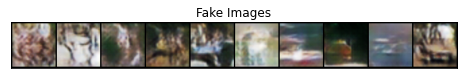

[20/40]   Loss_D:0.1696382462978363   Loss_G:3.086825132369995


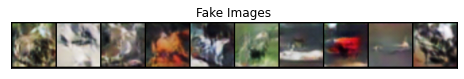

[30/40]   Loss_D:0.8069669008255005   Loss_G:1.6329467296600342


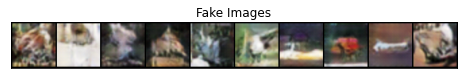

[40/40]   Loss_D:0.016566254198551178   Loss_G:5.076297283172607


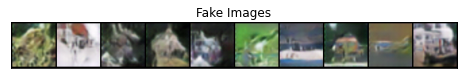

In [10]:
img_list = []
G_LOSS = []
D_LOSS = []
FID_score = []

for epoch in range(1,EPOCHS+1):
    DiscModel.train()
    GenModel.train()
    for i, (real, _) in enumerate(trainloader):
        real = real.to(device)
        mb_size = real.size(0)
        
        #### (1) TRAIN DISCRIMINATOR TO MAXIMIZE log(D(x)) + log(1- D(G(z)))
        #DiscModel.zero_grad()
        noise = torch.randn(mb_size, Z_DIM, 1, 1).to(device)
        #generate fake images
        fake = GenModel(noise)
        #train discriminator with real images
        disc_real = DiscModel(real).view(-1)
        label = torch.ones_like(disc_real)
        Dloss_real = criterion(disc_real, label)
        #Dloss_real.backward()
        
        #train discriminator with fake images
        disc_fake = DiscModel(fake.detach()).view(-1)
        label = torch.zeros_like(disc_fake)
        Dloss_fake = criterion(disc_fake, label)
        #Dloss_fake.backward()
        
        lossDisc = (Dloss_real + Dloss_fake) / 2
        DiscModel.zero_grad()
        lossDisc.backward()
        disc_optimizer.step()
        
        
        #### (1) TRAIN GENERATOR TO MAXIMIZE log(D(G(z)))
        GenModel.zero_grad()
        label = torch.ones_like(disc_real)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = DiscModel(fake).view(-1)
        #claculate gen's loss
        lossG = criterion(output, label)
        lossG.backward()
        #update generatir
        gen_optimizer.step()
        
        #if i%100 == 0:
        #save both losses for plot
        G_LOSS.append(lossG.item())
        D_LOSS.append(lossDisc.item())
        
        if lossG.item==0.0:
            break
    
        

    with torch.no_grad():
        GenModel.eval()
        fakes = GenModel(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fakes, padding=2, normalize=True, nrow=6))
    
    vutils.save_image(real.cpu(),'Images/dcganimages/real/image{}.png'.format(epoch), nrow=10, normalize=True)
    vutils.save_image(fakes.cpu(),'Images/dcganimages/fake/image{}.png'.format(epoch), nrow=10, normalize=True)
    
    #compute fid score
    #fid_score = compute_fidScore(real, fakes)
    #FID_score.append(fid_score)
    
    if epoch%10 == 0:
        print(f'[{epoch}/{EPOCHS}]   Loss_D:{lossDisc.item()}   Loss_G:{lossG.item()}') #, FID_Score:{fid_score:.2f}')
        imshow(fakes[:10].cpu(), 'Fake Images', figsize=(8,8), nrow=10)

#save image
vutils.save_image(fakes[:10].cpu(),'Images/dcganimage10.png', nrow=10)
vutils.save_image(fakes[:24].cpu(),'Images/dcganimage.png')
vutils.save_image(fakes[:10].cpu(),'Images/dcganimage10norm.png', nrow=10, normalize=True)
vutils.save_image(fakes[:24].cpu(),'Images/dcganimagenorm.png', normalize=True)
#save entire model
torch.save(GenModel,'Models/dcgan.pth')  

#save losses to file
losses = {'GenLoss': G_LOSS,
         'DiscLoss': D_LOSS}
with open('pickle/dcgan_loss.txt', 'wb') as f:
    pickle.dump(losses,f)

#save the generated images for visualization
with open('pickle/dcganImg.txt', 'wb') as f:
    pickle.dump(img_list,f)

#save fid score list to file
# with open('pickle/dcganfid.txt', 'wb') as f:
#     pickle.dump(FID_score,f)

### Plot Loss

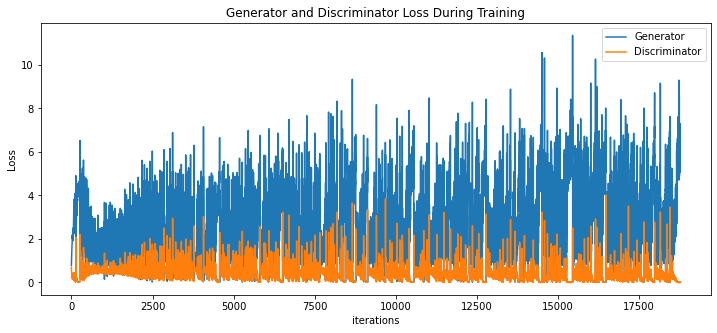

In [3]:
with open('pickle/dcgan_loss.txt', 'rb') as f:
    loss = pickle.load(f)
    
plt.figure(figsize=(12,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(loss['GenLoss'],label="Generator")
plt.plot(loss['DiscLoss'],label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Compute FID Scores

In [2]:
from FID import fidScore
dcgan_FID = []
for i in range(1,40):
    i = i+1
    fids = fidScore('Images/dcganimages/real', 'Images/dcganimages/fake',i,128)
    print(f'Epoch:{i} and FID Score: {fids}', end = '\r', flush=True)
    dcgan_FID.append(fids)

with open('pickle/dcganfid.txt', 'wb') as f:
    pickle.dump(dcgan_FID,f)

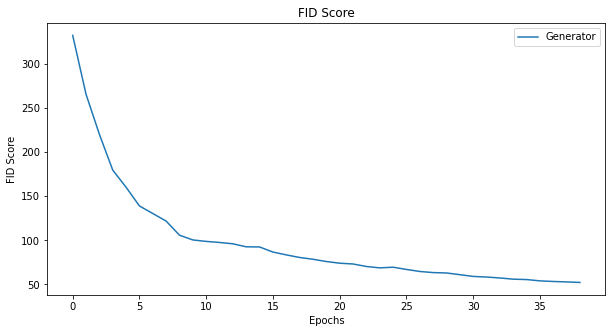

In [4]:
with open('pickle/dcganfid.txt', 'rb') as f:
    fid = pickle.load(f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score")
plt.plot(fid,label="Generator")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Visualize animation of images generated at every epoch

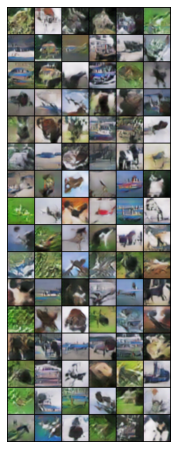

In [16]:
#%%capture
with open('pickle/dcganImg.txt', 'rb') as f:
    image_list = pickle.load(f)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())